In [47]:
import pandas as pd
import nltk
import nltk.stem
from nltk.corpus import stopwords
import re
from collections import Counter
from sklearn.naive_bayes import MultinomialNB 
from sklearn.cross_validation import cross_val_predict
from sklearn.metrics import classification_report
from sklearn.feature_extraction.text import TfidfTransformer
import numpy as np
from sklearn.decomposition import TruncatedSVD
import matplotlib.pyplot as plt
import random
import timeit
from nltk.util import ngrams

In [48]:
#AG News
# pré traitement
df_train = pd.read_csv("train.csv", names = ["classe","title","content"])

In [49]:
df_train.head()

,classe,title,content
0,3,Wall St. Bears Claw Back Into the Black (Reuters),"Reuters - Short-sellers, Wall Street's dwindli..."
1,3,Carlyle Looks Toward Commercial Aerospace (Reu...,Reuters - Private investment firm Carlyle Grou...
2,3,Oil and Economy Cloud Stocks' Outlook (Reuters),Reuters - Soaring crude prices plus worries\ab...
3,3,Iraq Halts Oil Exports from Main Southern Pipe...,Reuters - Authorities have halted oil export\f...
4,3,"Oil prices soar to all-time record, posing new...","AFP - Tearaway world oil prices, toppling reco..."


In [50]:
classes = ["World", "Sports", "Business", "Sci/Tech"]

In [51]:
df_train["classe"] = df_train["classe"].apply(lambda x: classes[x-1])

In [52]:
df_train.head()

,classe,title,content
0,Business,Wall St. Bears Claw Back Into the Black (Reuters),"Reuters - Short-sellers, Wall Street's dwindli..."
1,Business,Carlyle Looks Toward Commercial Aerospace (Reu...,Reuters - Private investment firm Carlyle Grou...
2,Business,Oil and Economy Cloud Stocks' Outlook (Reuters),Reuters - Soaring crude prices plus worries\ab...
3,Business,Iraq Halts Oil Exports from Main Southern Pipe...,Reuters - Authorities have halted oil export\f...
4,Business,"Oil prices soar to all-time record, posing new...","AFP - Tearaway world oil prices, toppling reco..."


In [53]:
classes_documents = (df_train["classe"] + ":" + df_train["title"] + " "+ df_train["content"]).tolist()

In [54]:
classes_documents  = [d.replace("\\"," ") for d in classes_documents]

In [55]:
classes_documents[:4]

["Business:Wall St. Bears Claw Back Into the Black (Reuters) Reuters - Short-sellers, Wall Street's dwindling band of ultra-cynics, are seeing green again.",
 'Business:Carlyle Looks Toward Commercial Aerospace (Reuters) Reuters - Private investment firm Carlyle Group, which has a reputation for making well-timed and occasionally controversial plays in the defense industry, has quietly placed its bets on another part of the market.',
 "Business:Oil and Economy Cloud Stocks' Outlook (Reuters) Reuters - Soaring crude prices plus worries about the economy and the outlook for earnings are expected to hang over the stock market next week during the depth of the summer doldrums.",
 'Business:Iraq Halts Oil Exports from Main Southern Pipeline (Reuters) Reuters - Authorities have halted oil export flows from the main pipeline in southern Iraq after intelligence showed a rebel militia could strike infrastructure, an oil official said on Saturday.']

In [56]:
corpus = []
for l in classes_documents:
    tokens  = l.strip().split(":")
    label = tokens[0]
    content = " ".join(tokens[1:])
    corpus.append((label,content))
corpus

[('Business',
  "Wall St. Bears Claw Back Into the Black (Reuters) Reuters - Short-sellers, Wall Street's dwindling band of ultra-cynics, are seeing green again."),
 ('Business',
  'Carlyle Looks Toward Commercial Aerospace (Reuters) Reuters - Private investment firm Carlyle Group, which has a reputation for making well-timed and occasionally controversial plays in the defense industry, has quietly placed its bets on another part of the market.'),
 ('Business',
  "Oil and Economy Cloud Stocks' Outlook (Reuters) Reuters - Soaring crude prices plus worries about the economy and the outlook for earnings are expected to hang over the stock market next week during the depth of the summer doldrums."),
 ('Business',
  'Iraq Halts Oil Exports from Main Southern Pipeline (Reuters) Reuters - Authorities have halted oil export flows from the main pipeline in southern Iraq after intelligence showed a rebel militia could strike infrastructure, an oil official said on Saturday.'),
 ('Business',
  'O

In [57]:
# Répartition des classes et nombre de mots moyens
Business = [line for line in corpus if line[0] == 'Business']
World = [line for line in corpus if line[0] == 'World']
Sports = [line for line in corpus if line[0] == 'Sports']
Sci_Tech = [line for line in corpus if line[0] == 'Sci/Tech']


total_words = 0
for line in corpus:
    total_words += len(line[1].split(" "))
    
print("Mean number of words : " + str(total_words/len(corpus)))

total_words_Business = 0
for line in Business:
    total_words_Business += len(line[1].split(" "))
    
print("Mean number of words in Business : " + str(total_words_Business/len(Business)))

total_words_World = 0
for line in World:
    total_words_World += len(line[1].split(" "))
    
print("Mean number of words in World: " + str(total_words_World/len(World)))

total_words_Sports = 0
for line in Sports:
    total_words_Sports += len(line[1].split(" "))
    
print("Mean number of words in Sports: " + str(total_words_Sports/len(Sports)))

total_words_Sci_Tech = 0
for line in Sci_Tech:
    total_words_Sci_Tech += len(line[1].split(" "))
    
print("Mean number of words in Sci_Tech: " + str(total_words_Sci_Tech/len(Sci_Tech)))


Mean number of words : 38.699958333333335
Mean number of words in Business : 38.85856666666667
Mean number of words in World: 39.66466666666667
Mean number of words in Sports: 38.27146666666667
Mean number of words in Sci_Tech: 38.00513333333333


In [58]:
df_train["classe"].value_counts()

Sports      30000
World       30000
Business    30000
Sci/Tech    30000
Name: classe, dtype: int64

In [59]:
y = df_train["classe"].tolist()

In [60]:
len(y),df_train.shape

(120000, (120000, 3))

In [61]:
documents = (df_train["title"] + " "+ df_train["content"]).tolist()

In [62]:
documents[:4]

["Wall St. Bears Claw Back Into the Black (Reuters) Reuters - Short-sellers, Wall Street's dwindling\\band of ultra-cynics, are seeing green again.",
 'Carlyle Looks Toward Commercial Aerospace (Reuters) Reuters - Private investment firm Carlyle Group,\\which has a reputation for making well-timed and occasionally\\controversial plays in the defense industry, has quietly placed\\its bets on another part of the market.',
 "Oil and Economy Cloud Stocks' Outlook (Reuters) Reuters - Soaring crude prices plus worries\\about the economy and the outlook for earnings are expected to\\hang over the stock market next week during the depth of the\\summer doldrums.",
 'Iraq Halts Oil Exports from Main Southern Pipeline (Reuters) Reuters - Authorities have halted oil export\\flows from the main pipeline in southern Iraq after\\intelligence showed a rebel militia could strike\\infrastructure, an oil official said on Saturday.']

In [63]:
documents  = [d.replace("\\"," ") for d in documents]

In [64]:
#Vectorisation

In [65]:
stopwords = stopwords.words("english")
stemmer_en=nltk.stem.SnowballStemmer('english')

In [66]:
#parse_test même chose que parse sans stemmatisation ni n-grams
def parse_test(document):
    document = document.lower()
    document = re.sub("[,:'!]", "", document)
    tokens = document.split(" ")
    tokens = [word for word in tokens if word.isalpha() and word not in stopwords]
    return Counter(tokens)

In [67]:
start_parse_test = timeit.default_timer()
histograms_test = [parse_test(d) for d in documents]
stop_parse_test = timeit.default_timer()
time_parse_test = stop_parse_test - start_parse_test
print('Time: ', time_parse_test)

Time:  11.971086072303706


In [68]:
def parse(document):
    document = document.lower()
    document = re.sub("[,:'!]", "", document)
    tokens = document.split(" ")
    tokens = [word for word in tokens if word.isalpha() and word not in stopwords]
    tokens = [stemmer_en.stem(e) for e in tokens]
    #tokens = ngrams(tokens,2) en commentaire car mauvaise visualisation pour le lsa
    return Counter(tokens)

In [69]:
start_parse = timeit.default_timer()
histograms = [parse(d) for d in documents]
stop_parse = timeit.default_timer()
time_parse = stop_parse - start_parse
print('Time: ', stop_parse - start_parse)

Time:  57.554184008918014


In [70]:
histograms

[Counter({'back': 1,
          'band': 1,
          'bear': 1,
          'black': 1,
          'claw': 1,
          'dwindl': 1,
          'green': 1,
          'reuter': 1,
          'see': 1,
          'street': 1,
          'wall': 2}),
 Counter({'aerospac': 1,
          'anoth': 1,
          'bet': 1,
          'carlyl': 2,
          'commerci': 1,
          'controversi': 1,
          'defens': 1,
          'firm': 1,
          'group': 1,
          'industri': 1,
          'invest': 1,
          'look': 1,
          'make': 1,
          'occasion': 1,
          'part': 1,
          'place': 1,
          'play': 1,
          'privat': 1,
          'quiet': 1,
          'reput': 1,
          'reuter': 1,
          'toward': 1}),
 Counter({'cloud': 1,
          'crude': 1,
          'depth': 1,
          'earn': 1,
          'economi': 2,
          'expect': 1,
          'hang': 1,
          'market': 1,
          'next': 1,
          'oil': 1,
          'outlook': 2,
          'plu

In [71]:
from sklearn.feature_extraction import DictVectorizer
def vectorize(histograms):
    vec = DictVectorizer()
    mat = vec.fit_transform(histograms)
    return mat,vec.get_feature_names()

In [72]:
start_vectorize_test = timeit.default_timer()
X_test,feature_names_test = vectorize(histograms_test)
stop_vectorize_test = timeit.default_timer()
time_vectorize_test = stop_vectorize_test - start_vectorize_test
print('Time: ', time_vectorize_test)

Time:  3.2717032090796465


In [73]:
start_vectorize = timeit.default_timer()
X,feature_names = vectorize(histograms)
stop_vectorize = timeit.default_timer()
time_vectorize = stop_vectorize - start_vectorize
print('Time: ', time_vectorize)

Time:  3.207051875173761


In [74]:
X.shape

(120000, 39961)

In [75]:
X_test.shape

(120000, 59245)

In [76]:
#Classification

In [77]:
def classify_and_evaluate(X, y):
    cls = MultinomialNB()
    predictions = cross_val_predict(cls, X, y)
    print("Nombre d'erreurs :", len([(truth, prediction)\
                                     for truth, prediction in zip(y, predictions)\
                                     if truth != prediction]), end="\n\n")
    print(classification_report(y, predictions))

In [78]:
start_classify_test = timeit.default_timer()
classify_and_evaluate(X_test, y)
stop_classify_test = timeit.default_timer()
time_classify_test = stop_classify_test - start_classify_test
print('Time: ', time_classify_test)

Nombre d'erreurs : 13018

             precision    recall  f1-score   support

   Business       0.86      0.85      0.85     30000
   Sci/Tech       0.85      0.86      0.86     30000
     Sports       0.95      0.97      0.96     30000
      World       0.91      0.88      0.90     30000

avg / total       0.89      0.89      0.89    120000

Time:  1.2964652597074746


In [79]:
start_classify = timeit.default_timer()
classify_and_evaluate(X, y)
stop_classify = timeit.default_timer()
time_classify = stop_classify - start_classify
print('Time: ', time_classify)

Nombre d'erreurs : 13193

             precision    recall  f1-score   support

   Business       0.85      0.85      0.85     30000
   Sci/Tech       0.85      0.86      0.86     30000
     Sports       0.94      0.97      0.96     30000
      World       0.91      0.88      0.89     30000

avg / total       0.89      0.89      0.89    120000

Time:  1.196419943536398


In [80]:
# On utilise le même type de filtrage que vu plus pour supprimer plus de colonnes (donc de mots).
start_vectorize_parse = timeit.default_timer()

X, feature_names = vectorize(map(parse, documents))
keeping = (X.sum(axis=0) > 3).A.ravel()
X = X[:,keeping]

stop_vectorize_parse = timeit.default_timer()
time_vectorize_parse = stop_vectorize_parse - start_vectorize_parse
print('Time: ', time_vectorize_parse)

# On peut utiliser le vecteur de booléens `keeping` pour construire la liste des mots gardés.
# C'est facile puisque `keeping` et `feature_names` sont alignés, c'est-à-dire que ce sont des listes
# de même taille, stockant des informations sur les mêmes choses dans le même ordre, par construction.
kept_features = [f_name for f_name, keep in zip(feature_names, keeping) if keep]

Time:  61.734384079023926


In [81]:
start_vectorize_parse_test = timeit.default_timer()

X_test, feature_names_test = vectorize(map(parse_test, documents))
keeping_test = (X_test.sum(axis=0) > 3).A.ravel()
X_test = X_test[:,keeping_test]

stop_vectorize_parse_test = timeit.default_timer()
time_vectorize_parse_test = stop_vectorize_parse_test - start_vectorize_parse_test
print('Time: ', time_vectorize_parse_test)

kept_features_test = [f_name for f_name, keep in zip(feature_names_test, keeping_test) if keep]

Time:  14.655782627643134


In [82]:
X.shape

(120000, 19015)

In [83]:
X_test.shape

(120000, 28399)

In [84]:
# Normalisation TF.IDF
start_Tfidf = timeit.default_timer()

X = TfidfTransformer(norm=False).fit_transform(X)

stop_Tfidf = timeit.default_timer()
time_Tfidf = stop_Tfidf - start_Tfidf
print('Time: ', time_Tfidf)

Time:  0.13901682856294428


In [85]:
# Normalisation TF.IDF
start_Tfidf_test = timeit.default_timer()

X_test = TfidfTransformer(norm=False).fit_transform(X_test)

stop_Tfidf_test = timeit.default_timer()
time_Tfidf_test = stop_Tfidf_test - start_Tfidf_test
print('Time: ', time_Tfidf_test)

Time:  0.16951287484516797


In [86]:
# On filtre sur les classes qui nous intéressent
kept_rows = [i for i, elem in enumerate(y) if elem in ["World", "Sports"]]
y = [y[i] for i in kept_rows]
X = X[kept_rows]

In [87]:
# Calcul des mots les plus représentés
best_words_idx = np.argsort(X.sum(axis=0).A.ravel())[-50:]
best_words = [kept_features[i] for i in best_words_idx]

In [88]:
# Transformation LSA
svd_transformer = TruncatedSVD(n_components=200)
Xk = svd_transformer.fit_transform(X)

In [89]:
classify_and_evaluate(X, y)

Nombre d'erreurs : 1887

             precision    recall  f1-score   support

     Sports       0.96      0.98      0.97     30000
      World       0.98      0.96      0.97     30000

avg / total       0.97      0.97      0.97     60000



[2116, 15233, 6608, 8921, 32430, 35098, 17884, 13827, 24497, 8094, 50484, 14971, 48675, 1641, 35203, 49080, 43633, 54679, 34035, 22623, 58262, 2754, 41401, 31514, 56192, 44598, 31822, 34582, 19576, 10735, 34824, 44036, 46421, 30847, 1047, 7004, 4011, 45301, 41857, 40616, 54592, 33010, 18140, 18976, 56447, 30473, 17941, 10065, 1240, 23012]
['World', 'Sports', 'Sports', 'World', 'World', 'World', 'World', 'World', 'World', 'Sports', 'Sports', 'World', 'World', 'World', 'World', 'Sports', 'Sports', 'Sports', 'World', 'Sports', 'World', 'World', 'Sports', 'World', 'World', 'Sports', 'World', 'Sports', 'Sports', 'Sports', 'Sports', 'World', 'Sports', 'Sports', 'Sports', 'World', 'Sports', 'Sports', 'Sports', 'World', 'World', 'World', 'World', 'Sports', 'Sports', 'Sports', 'Sports', 'World', 'Sports', 'World']


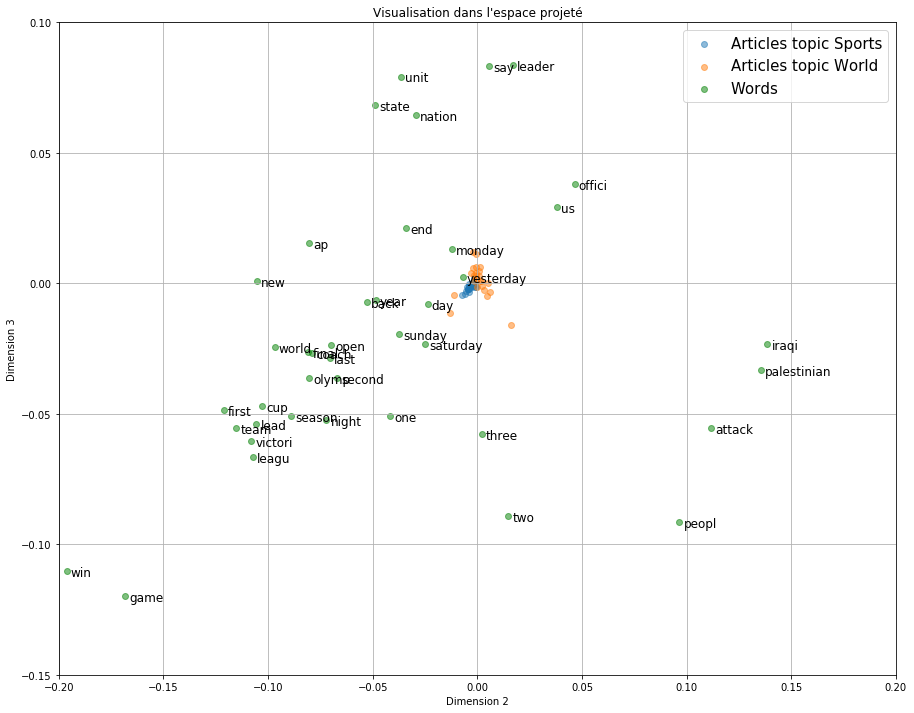

In [90]:
%matplotlib inline
# Visualisation
fig, ax = plt.subplots()
fig.set_size_inches(15, 12)

# On sélectionne 50 articles au hasard
random_lines = random.sample(range(X.shape[0]), 50)
print(random_lines)

x_doc, y_doc = (Xk[:,1:3] * (1. / svd_transformer.singular_values_[1:3]))[random_lines].T
labels_selected_articles = [y[i] for i in random_lines]
print(labels_selected_articles)

for topic in set(labels_selected_articles):
    x_doc_ = [x_doc[i] for i, e in enumerate(labels_selected_articles) if e == topic]
    y_doc_ = [y_doc[i] for i, e in enumerate(labels_selected_articles) if e == topic]
    ax.scatter(x_doc_, y_doc_, alpha=0.5, label="Articles topic " + topic)

ax.set_ylim(top=0.1, bottom=-0.15)
ax.set_xlim(right=0.2, left=-0.2)

x_term, y_term = svd_transformer.components_[1:3,best_words_idx]
ax.scatter(x_term, y_term, c="g", alpha=0.5, label="Words")
for x_, y_, s in zip(x_term, y_term, best_words):
    if x_ >= ax.get_xlim()[0] and x_ <= ax.get_xlim()[1] and y_ >= ax.get_ylim()[0] and y_ <= ax.get_ylim()[1]:
        ax.text(x_ + 0.002, y_ - 0.002, s, fontsize=12)

ax.grid()
ax.legend(fontsize=15, loc=0)
ax.set_xlabel("Dimension 2")
ax.set_ylabel("Dimension 3")
ax.set_title("Visualisation dans l'espace projeté");

In [91]:
from sklearn.decomposition import LatentDirichletAllocation
lda = LatentDirichletAllocation(n_components = 6,max_iter = 5,learning_method = "online",random_state=42)

In [92]:
lda_topic_matrix = lda.fit_transform(X)

In [93]:
topic_words = {}
n_top_words = 8

In [94]:
for topic, comp in enumerate(lda.components_):   
    word_idx = np.argsort(comp)[::-1][:n_top_words]

    topic_words[topic] = [kept_features[i] for i in word_idx]

In [95]:
for topic, words in topic_words.items():
    print('Topic: %d' % topic)
    print('  %s' % ', '.join(words))

Topic: 0
  coach, footbal, england, japan, madrid, arsenal, manag, club
Topic: 1
  game, red, peac, sox, season, ap, boston, darfur
Topic: 2
  kill, palestinian, iraqi, iraq, bomb, attack, polic, baghdad
Topic: 3
  nuclear, china, north, talk, un, south, korea, trade
Topic: 4
  presid, elect, bush, iran, leader, minist, iraq, vote
Topic: 5
  win, victori, lead, leagu, first, score, cup, point


In [96]:
weights = lda.components_
weights

array([[  1.67636561e-01,   2.50765586e+00,   1.36857404e+02, ...,
          1.66779350e-01,   1.66921398e-01,   1.69217632e-01],
       [  1.66740961e-01,   1.67211014e-01,   1.68010974e-01, ...,
          1.66795456e-01,   7.36338075e+01,   1.67514052e-01],
       [  1.66666768e-01,   3.81910350e+00,   1.66666825e-01, ...,
          1.66679593e-01,   1.66743567e-01,   1.66711246e-01],
       [  4.35162591e-01,   1.67016111e-01,   1.67357028e-01, ...,
          1.66789753e-01,   1.66827202e-01,   1.66903954e-01],
       [  3.79790939e+00,   1.67022524e-01,   1.66667084e-01, ...,
          1.66778054e-01,   1.66698512e-01,   1.66666732e-01],
       [  1.67214462e-01,   1.66666723e-01,   3.79113042e-01, ...,
          4.54790035e+02,   1.66880389e-01,   7.59921097e+01]])

In [97]:
#Corpus Brown
corpus_brown = pd.read_json("brown_corpus.json")

In [98]:
corpus_brown.head()

,category,id,text
0,adventure,cn01,\n\n\tDan Morgan told himself he would forget ...
1,adventure,cn02,\n\n\tGavin paused wearily. ``You can't stay h...
2,adventure,cn03,"\n\n\tThe sentry was not dead. He was, in fact..."
3,adventure,cn04,\n\n\t``So it wasn't the earthquake that made ...
4,adventure,cn05,"She was carrying a quirt, and she started to r..."


In [99]:
corpus_brown["category"].value_counts()

learned            80
belles_lettres     75
lore               48
news               44
hobbies            36
government         30
romance            29
adventure          29
fiction            29
editorial          27
mystery            24
religion           17
reviews            17
humor               9
science_fiction     6
Name: category, dtype: int64

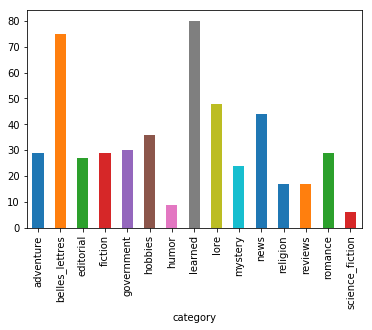

In [100]:
corpus_brown.groupby("category").size().plot(kind="bar")

In [101]:
corpus_brown["text_len"] = corpus_brown["text"].apply(lambda x: len(x))

In [102]:
print("mean word total "+ str(corpus_brown["text_len"].mean()))

mean word total 12110.99


In [103]:
print("mean word learned " + str(corpus_brown[corpus_brown["category"]=="learned"]["text_len"].mean()))
print("mean word belles_lettres " + str(corpus_brown[corpus_brown["category"]=="belles_lettres"]["text_len"].mean()))
print("mean word lore " + str(corpus_brown[corpus_brown["category"]=="lore"]["text_len"].mean()))
print("mean word news "+ str(corpus_brown[corpus_brown["category"]=="news"]["text_len"].mean()))
print("mean word hobbies " + str(corpus_brown[corpus_brown["category"]=="hobbies"]["text_len"].mean()))
print("mean word government " + str(corpus_brown[corpus_brown["category"]=="government"]["text_len"].mean()))
print("mean word fiction "+ str(corpus_brown[corpus_brown["category"]=="fiction"]["text_len"].mean()))
print("mean word romance " + str(corpus_brown[corpus_brown["category"]=="romance"]["text_len"].mean()))
print("mean word adventure " + str(corpus_brown[corpus_brown["category"]=="adventure"]["text_len"].mean()))
print("mean word adventure science_fiction " + str(corpus_brown[corpus_brown["category"]=="science_fiction"]["text_len"].mean()))
print("mean word adventure editorial " + str(corpus_brown[corpus_brown["category"]=="editorial"]["text_len"].mean()))
print("mean word adventure mystery " + str(corpus_brown[corpus_brown["category"]=="mystery"]["text_len"].mean()))
print("mean word adventure religion " + str(corpus_brown[corpus_brown["category"]=="religion"]["text_len"].mean()))
print("mean word adventure reviews " + str(corpus_brown[corpus_brown["category"]=="reviews"]["text_len"].mean()))
print("mean word adventure humor " + str(corpus_brown[corpus_brown["category"]=="humor"]["text_len"].mean()))

mean word learned 12588.325
mean word belles_lettres 12130.8
mean word lore 12091.770833333334
mean word news 12278.727272727272
mean word hobbies 12161.75
mean word government 13170.166666666666
mean word fiction 11320.103448275862
mean word romance 11354.344827586207
mean word adventure 11348.448275862069
mean word adventure science_fiction 11832.0
mean word adventure editorial 12169.666666666666
mean word adventure mystery 11243.958333333334
mean word adventure religion 12096.823529411764
mean word adventure reviews 12714.117647058823
mean word adventure humor 11904.888888888889


In [104]:
documents_brown = corpus_brown["text"].tolist()

In [105]:
documents_brown[0]

"\n\n\tDan Morgan told himself he would forget Ann Turner. He was well rid of her. He certainly didn't want a wife who was fickle as Ann. If he had married her, he'd have been asking for trouble. \n\n\tBut all of this was rationalization. Sometimes he woke up in the middle of the night thinking of Ann, and then could not get back to sleep. His plans and dreams had revolved around her so much and for so long that now he felt as if he had nothing. The easiest thing would be to sell out to Al Budd and leave the country, but there was a stubborn streak in him that wouldn't allow it. \n\n\tThe best antidote for the bitterness and disappointment that poisoned him was hard work. He found that if he was tired enough at night, he went to sleep simply because he was too exhausted to stay awake. Each day he found himself thinking less often of Ann ; ; each day the hurt was a little duller, a little less poignant. \n\n\tHe had plenty of work to do. Because the summer was unusually dry and hot, the

In [106]:
y_brown = corpus_brown["category"].tolist()

In [107]:
len(y_brown),corpus_brown.shape

(500, (500, 4))

In [108]:
histograms_brown = [parse(d) for d in documents_brown]

In [109]:
histograms_brown

[Counter({'afford': 2,
          'afternoon': 1,
          'ahead': 1,
          'al': 2,
          'alik': 1,
          'allow': 1,
          'almost': 2,
          'along': 1,
          'amaz': 1,
          'angl': 1,
          'ann': 3,
          'antidot': 1,
          'arm': 2,
          'around': 1,
          'asham': 1,
          'ask': 2,
          'asleep': 1,
          'attract': 1,
          'aw': 2,
          'b': 1,
          'back': 5,
          'bad': 2,
          'bar': 1,
          'beard': 1,
          'bed': 1,
          'bedroom': 1,
          'behind': 1,
          'besid': 2,
          'best': 1,
          'better': 3,
          'billi': 1,
          'bitter': 1,
          'blanket': 1,
          'blond': 2,
          'blue': 1,
          'boiler': 1,
          'box': 1,
          'boy': 5,
          'brought': 3,
          'bruis': 1,
          'bucket': 2,
          'buckhorn': 1,
          'budd': 4,
          'built': 1,
          'burn': 1,
          'came': 

In [110]:
X_brown,feature_names_brown = vectorize(histograms_brown)

In [111]:
X_brown.shape

(500, 23871)

In [112]:
classify_and_evaluate(X_brown, y_brown)

Nombre d'erreurs : 279

                 precision    recall  f1-score   support

      adventure       0.50      0.59      0.54        29
 belles_lettres       0.30      0.76      0.43        75
      editorial       0.67      0.07      0.13        27
        fiction       0.44      0.28      0.34        29
     government       0.65      0.50      0.57        30
        hobbies       0.71      0.33      0.45        36
          humor       0.00      0.00      0.00         9
        learned       0.55      0.57      0.56        80
           lore       0.33      0.17      0.22        48
        mystery       0.60      0.25      0.35        24
           news       0.64      0.80      0.71        44
       religion       1.00      0.06      0.11        17
        reviews       0.00      0.00      0.00        17
        romance       0.33      0.48      0.39        29
science_fiction       0.00      0.00      0.00         6

    avg / total       0.48      0.44      0.41       500



C:\Users\JOUNAID\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [113]:
# On utilise le même type de filtrage que vu plus pour supprimer plus de colonnes (donc de mots).
X_brown, feature_names_brown = vectorize(map(parse, documents_brown))
keeping_brown = (X_brown.sum(axis=0) > 3).A.ravel()
X_brown = X_brown[:,keeping_brown]

kept_features_brown = [f_name for f_name, keep in zip(feature_names_brown, keeping_brown) if keep]

In [114]:
X_brown.shape

(500, 9851)

In [115]:
# Normalisation TF.IDF
X_brown = TfidfTransformer(norm=False).fit_transform(X_brown)

In [116]:
# Calcul des mots les plus représentés
best_words_idx_brown = np.argsort(X_brown.sum(axis=0).A.ravel())[-50:]
best_words_brown = [kept_features_brown[i] for i in best_words_idx_brown]

In [117]:
# Transformation LSA
svd_transformer_brown = TruncatedSVD(n_components=200)
Xk_brown = svd_transformer_brown.fit_transform(X_brown)

In [118]:
classify_and_evaluate(X_brown, y_brown)

Nombre d'erreurs : 264

                 precision    recall  f1-score   support

      adventure       0.47      0.59      0.52        29
 belles_lettres       0.50      0.51      0.50        75
      editorial       0.40      0.67      0.50        27
        fiction       0.40      0.34      0.37        29
     government       0.50      0.60      0.55        30
        hobbies       0.59      0.36      0.45        36
          humor       0.13      0.22      0.17         9
        learned       0.73      0.40      0.52        80
           lore       0.29      0.15      0.19        48
        mystery       0.44      0.50      0.47        24
           news       0.67      0.70      0.69        44
       religion       0.50      0.59      0.54        17
        reviews       0.39      0.65      0.49        17
        romance       0.38      0.52      0.44        29
science_fiction       0.12      0.33      0.17         6

    avg / total       0.50      0.47      0.47       500



[52, 131, 359, 258, 392, 429, 47, 324, 382, 106, 32, 269, 11, 336, 159, 417, 236, 315, 496, 265, 357, 439, 30, 370, 482, 458, 105, 178, 38, 459, 55, 82, 134, 489, 46, 462, 67, 175, 395, 430, 108, 94, 351, 409, 380, 48, 452, 499, 185, 256]
['belles_lettres', 'fiction', 'lore', 'learned', 'news', 'news', 'belles_lettres', 'lore', 'mystery', 'editorial', 'belles_lettres', 'learned', 'adventure', 'lore', 'fiction', 'news', 'learned', 'lore', 'science_fiction', 'learned', 'lore', 'religion', 'belles_lettres', 'mystery', 'romance', 'reviews', 'editorial', 'government', 'belles_lettres', 'reviews', 'belles_lettres', 'belles_lettres', 'fiction', 'romance', 'belles_lettres', 'reviews', 'belles_lettres', 'government', 'news', 'news', 'editorial', 'belles_lettres', 'lore', 'news', 'mystery', 'belles_lettres', 'reviews', 'science_fiction', 'government', 'learned']


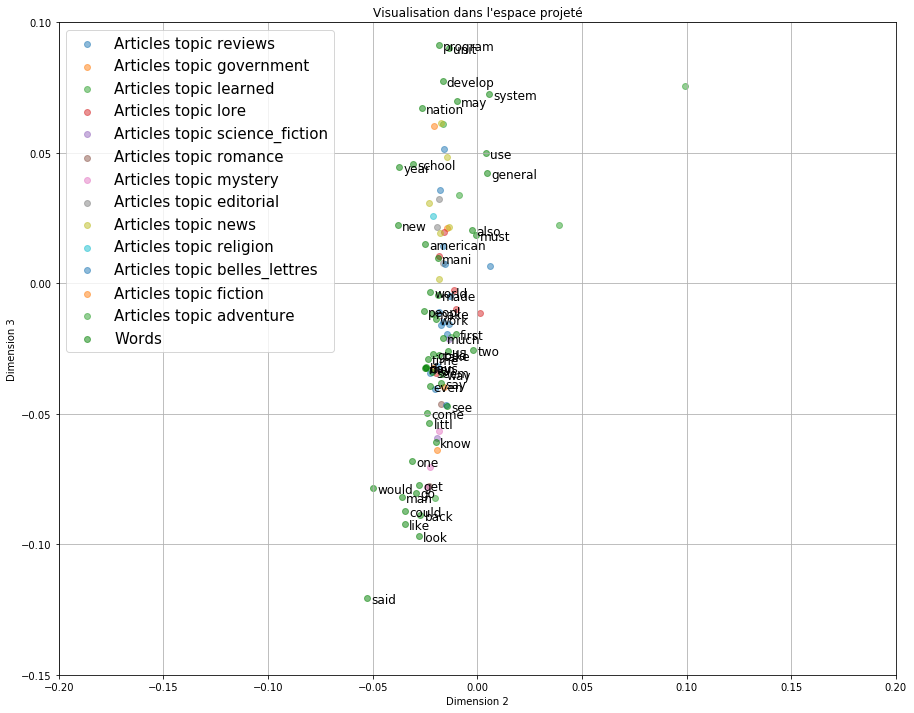

In [119]:
%matplotlib inline
# Visualisation
fig, ax = plt.subplots()
fig.set_size_inches(15, 12)

# On sélectionne 50 articles au hasard
random_lines_brown = random.sample(range(X_brown.shape[0]), 50)
print(random_lines_brown)

x_doc_brown, y_doc_brown = (Xk_brown[:,1:3] * (1. / svd_transformer_brown.singular_values_[1:3]))[random_lines_brown].T
labels_selected_articles_brown = [y_brown[i] for i in random_lines_brown]
print(labels_selected_articles_brown)

for topic in set(labels_selected_articles_brown):
    x_doc_brown_ = [x_doc_brown[i] for i, e in enumerate(labels_selected_articles_brown) if e == topic]
    y_doc_brown_ = [y_doc_brown[i] for i, e in enumerate(labels_selected_articles_brown) if e == topic]
    ax.scatter(x_doc_brown_, y_doc_brown_, alpha=0.5, label="Articles topic " + topic)

ax.set_ylim(top=0.1, bottom=-0.15)
ax.set_xlim(right=0.2, left=-0.2)

x_term_brown, y_term_brown = svd_transformer_brown.components_[1:3,best_words_idx_brown]
ax.scatter(x_term_brown, y_term_brown, c="g", alpha=0.5, label="Words")
for x_, y_, s in zip(x_term_brown, y_term_brown, best_words_brown):
    if x_ >= ax.get_xlim()[0] and x_ <= ax.get_xlim()[1] and y_ >= ax.get_ylim()[0] and y_ <= ax.get_ylim()[1]:
        ax.text(x_ + 0.002, y_ - 0.002, s, fontsize=12)

ax.grid()
ax.legend(fontsize=15, loc=0)
ax.set_xlabel("Dimension 2")
ax.set_ylabel("Dimension 3")
ax.set_title("Visualisation dans l'espace projeté");

In [120]:
from sklearn.decomposition import LatentDirichletAllocation
lda_brown = LatentDirichletAllocation(n_components = 15,max_iter = 5,learning_method = "online",random_state=42)

In [121]:
lda_brown.fit(X_brown)

LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
             evaluate_every=-1, learning_decay=0.7,
             learning_method='online', learning_offset=10.0,
             max_doc_update_iter=100, max_iter=5, mean_change_tol=0.001,
             n_components=15, n_jobs=1, n_topics=None, perp_tol=0.1,
             random_state=42, topic_word_prior=None,
             total_samples=1000000.0, verbose=0)

In [122]:
weights = lda_brown.components_
weights

array([[  0.32655732,   7.85675396,   0.12736122, ...,   0.14879543,
          0.44827097,   0.23882023],
       [  0.24657741,   3.206794  ,   0.14985333, ...,   0.12782791,
          3.87807803,   0.32698722],
       [  0.42331625,   3.71609265,   0.4894369 , ...,   0.26547743,
          3.0515429 ,   8.80664381],
       ..., 
       [  0.16629586,   0.9183079 ,   0.14683184, ...,   0.13388627,
          0.28073673,   0.15992422],
       [  0.20563083,   4.06702543,   0.16029884, ...,   0.13819641,
          4.79023262,   0.21522895],
       [  0.28118406,  10.73578199,   0.84027337, ...,   0.14171264,
          0.18500159,   0.16182304]])

In [123]:
topic_words_brown = {}
n_top_words_brown = 8

In [124]:
for topic, comp in enumerate(lda_brown.components_):   
    word_idx_brown = np.argsort(comp)[::-1][:n_top_words_brown]

    topic_words_brown[topic] = [kept_features_brown[i] for i in word_idx_brown]

In [125]:
for topic, words in topic_words_brown.items():
    print('Topic: %d' % topic)
    print('  %s' % ', '.join(words))

Topic: 0
  food, cattl, feed, seed, meat, rector, hudson, use
Topic: 1
  af, cost, oper, state, rate, tax, electron, industri
Topic: 2
  one, southern, snake, south, negro, cool, river, feet
Topic: 3
  social, may, one, must, system, nation, mean, number
Topic: 4
  church, god, music, christian, jazz, christ, cathol, song
Topic: 5
  student, colleg, cell, foam, af, dictionari, faculti, chlorin
Topic: 6
  said, look, would, like, could, back, go, get
Topic: 7
  school, junior, citi, said, board, would, shelter, educ
Topic: 8
  state, govern, presid, unit, feder, nation, democrat, new
Topic: 9
  wine, would, matsuo, one, marin, fogg, coolidg, alex
Topic: 10
  stain, wright, deegan, miriam, andi, conjug, mike, nonspecif
Topic: 11
  one, poem, art, year, book, new, say, artist
Topic: 12
  morgan, hearst, theresa, clay, cousin, shu, chandler, command
Topic: 13
  mantl, palmer, linda, player, henrietta, john, bobbi, leagu
Topic: 14
  arteri, mercer, stress, helva, platform, emot, bronchial, 